# AOS AuxTel test data : different hexapod positions

Setup:

    ssh -L 54467:localhost:54467 scichris@lsst-devl02
    source "/software/lsstsw/stack/loadLSST.bash"
    setup lsst_distrib
    source /project/scichris/aos/setup_aos_current.sh
    jupyter notebook --no-browser --port=54467

Use data from Tiago : `Target: HD 187101`

Description: Sequence of intra/extra pairs offsetting the hexapod in x and y

    434-435: +0.5mm in x
    437-438: +1.0mm in x
    440-441: +2.0mm in x
    444-445: -1.0mm in x
    447-448: -2.0mm in x
    450-451: -3.0mm in x
    454-455: +0.5mm in y
    457-458: +1.0mm in y
    460-461: +2.0mm in y
    463-464: +4.0mm in y
    467-468: -1.0mm in y
    470-471: -2.0mm in y

Run the ISR:
    
    ssh lsst-devl02

    source "/software/lsstsw/stack/loadLSST.bash"
    setup lsst_distrib

https://pipelines.lsst.io/v/weekly/modules/lsst.daf.butler/queries.html#dimension-expressions

    pipetask run  --data-query "exposure IN (2021060800434..2021060800471) AND instrument='LATISS' " -b /repo/main/butler.yaml --input  LATISS/raw/all,LATISS/calib,u/czw/DM-28920/calib.20210720  --output u/scichris/Latiss/postISRtest --pipeline /project/scichris/aos/testLatiss4.yaml  --register-dataset-types
    

In [1]:
%matplotlib inline
from astropy.io import fits
from astropy.visualization import ZScaleInterval
import matplotlib.pyplot as plt
import numpy as np 
from lsst.daf import butler as dafButler


def preview_auxtel_exposures(year='2021', monthDay='0908', expStart=483, expEnd=490,
                            datasetRefOrType='raw', collection='LATISS/raw/all'):

    butler = dafButler.Butler('/repo/main/')
    
    # figure out how many images to plot
    nexp = expEnd-expStart

    # calculate how many cols and rows we need 
    if nexp > 3:
        ncol = 3
        nrows = (nexp // ncol) + 1
    else:
        ncol=nexp
        nrows = 1
        
    zscale = ZScaleInterval()
    # do the plotting 
    fig,axs = plt.subplots(nrows,ncol,figsize=(ncol*4,nrows*4))
    ax = np.ravel(axs)
    i=0
    for exp in range(expStart,expEnd):
        exposure = butler.get(datasetRefOrType, dataId={'instrument':'LATISS', 'detector':0, 
                                         'exposure':int(f'{year}{monthDay}00{exp}')
                                            },
                          collections=[collection])
        data = exposure.image.array
        vmin, vmax = zscale.get_limits(data)
        ax[i].imshow(data,vmin=vmin,vmax=vmax,origin=
                  'lower')
        ax[i].set_title(f"{year}{monthDay}, exp {exp},\n focusz={np.round(exposure.getMetadata()['FOCUSZ'],3)}")
        i += 1
    fig.subplots_adjust(hspace=0.25)

    # if there are more axes than exposures,
    # turn off the extra axes 
    ncells = nrows*ncol
    if ncells > nexp:
        for axis in ax[nexp:]:
            axis.axis("off")

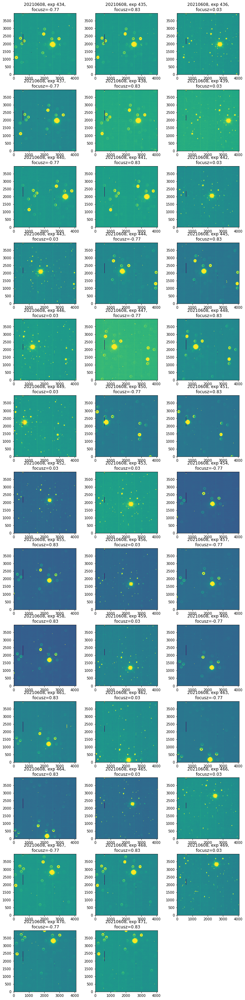

In [2]:
#2021 - 06 - 08
preview_auxtel_exposures(year='2021',monthDay='0608', 
                         expStart=434, expEnd=472,
                         datasetRefOrType='postISRCCD', 
                         collection='u/scichris/Latiss/postISRtest')

Based on these, define intra/extra pairs. Run Zernike Estimation:

In [2]:
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from lsst.ts.wep.Utility import DefocalType
from copy import copy
from lsst.ts.wep.DonutDetector import DonutDetector
from lsst.daf import butler as dafButler

def fit_zernikes(estimateZernikeTask, exp=307,year='2021', monthDay='0323',
                datasetRefOrType='postISRCCD', collection='u/scichris/Latiss/postISRtest',):

    butler = dafButler.Butler('/repo/main/')
    
    # load the exposure pair 
    exposure_intra = butler.get(datasetRefOrType, dataId={'instrument':'LATISS', 'detector':0, 
                                             'exposure':int(f'{year}{monthDay}00{exp}')
                                                }, collections=[collection])

    exposure_extra = butler.get(datasetRefOrType, dataId={'instrument':'LATISS', 'detector':0, 
                                             'exposure':int(f'{year}{monthDay}00{exp+1}')
                                                }, collections=[collection])

    # declare the exposure pair
    exposure_pair = [exposure_intra, exposure_extra ]

    print(f'\nRunning Zk fitting for exposure={exp}')


    # get the  template from estimateZernikeTask. 

    detectorName = exposure_extra.getDetector().getName()
    pixelScale = exposure_extra.getWcs().getPixelScale().asArcseconds()
    defocalType = DefocalType.Extra
    template = estimateZernikeTask.getTemplate(detectorName, defocalType, pixelScale)

    # detect donuts  in one of the defocal images 
    detector = DonutDetector()
    expArray = copy(exposure_extra.getImage().getArray())

    # use the adaptive threshold finding algorithm for the binary image 
    donutDf = detector.detectDonuts(expArray, template, blendRadius=200,
                                       peakThreshold=0.99, binaryChoice = 'deblend')
    np.save(f'donuts_{year}{monthDay}00{exp}.npy', donutDf)

    # make a donut catalog :
    ## remove the blends in donut catalog 
    donutDfClean = donutDf[~donutDf['blended']].copy()

    ## update column names and content 
    donutCatUpd = update_donut_cat(donutDfClean.copy(), exposure_intra)

    # run zernike estimation
    zernikeOutput = estimateZernikeTask.run(exposure_pair, donutCatUpd, "LATISS")

    # store zernikes as dict
    zernikes = zernikeOutput.getDict()
    fname = f'zerDic_{year}{monthDay}00{exp}.npy'
    np.save(fname,zernikes)
    print(f'Stored the results as {fname} ')
    
def update_donut_cat(donutCat, exposure):
    
    ## rename columns, as the EstimateZernikes  expects different names:
    ## coord_ra; coord_dec; centroid_x; centroid_y; source_flux; detector; mags
    
    
    # and add a detector column 
    donutCat['detector'] = exposure.getDetector().getName()

    # rename columns: transpose y --> x 
    donutCat = donutCat.rename(columns={"y_center":"centroid_x", "x_center":"centroid_y"})
    
    # pass whatever ra,dec to the catalog - they're not used, but are required to be there 
    wcs = exposure.getWcs()
    x = np.array(donutCat['centroid_x'].values)
    y = np.array(donutCat['centroid_y'].values)

    x = np.zeros(0)
    for row in donutCat['centroid_x'] : 
        x = np.append(x, row)

    ra,dec = wcs.pixelToSkyArray(x,y,degrees=False)  
    
    donutCat['coord_ra'] = ra
    donutCat['coord_dec'] = dec
    return donutCat

In [4]:
# initialize the zernike Task - has to be done only once 
from lsst.ts.wep.task.EstimateZernikesLatissTask import EstimateZernikesLatissTask, EstimateZernikesLatissTaskConfig
estimateZernikeConfig = EstimateZernikesLatissTaskConfig(donutStampSize=200,donutTemplateSize=200)
estimateZernikeTask = EstimateZernikesLatissTask(config=estimateZernikeConfig)
estimateZernikeTask.instName = 'auxTel'
estimateZernikeTask.opticalModel = 'onAxis'

expIntra = [434, 437, 440, 444, 447, 450, 454, 457, 
           460, 463, 467, 470]
year = '2021'
monthDay = '0608'
#expExtra = np.array(expIntra)+1
for exp in expIntra:
    fit_zernikes(estimateZernikeTask, exp=exp,
                 year=year, monthDay=monthDay,)


Running Zk fitting for exposure=434
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
Using deblendAdapt _getImgBinaryAdapt to get image binary
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
0 / 4
imageCoCenter: (x, y) = (  100.94,   99.89)

imageCoCenter: (x, y) = (  101.22,  100.79)

itr = 0, z4-z22
[-23. -37. -98. 150.  14. -24.  17.  -1.   6.   6.  11.   7.  -1. -28.
  -3.   1.   2.   3.   4.]
itr = 1, z4-z22
[-30. -38. -99. 150.  14. -25.  17.  -2.   6.   6.  11.   7.  -2. -29.
  -3.   1.   3.   3.   4.]
itr = 2, z4-z22
[ -34.  -38. -104.  148.   14.  -27.   17.   -2.    7.    6.   11.    7.
   -2.  -28.   -3.    2.    3.    3.    3.]
itr = 3, z4-z22
[ -40.  -50. -134.  151.   15.  -25.   17.   -2.    5.    5.   11.    7.
   -1.  -28.   -3.    1.    3.    3.    3.]
itr = 4, z4-z22
[ -43.  -60. -159.  151.   14.  -25.   17.   -2.    5.    5.  

itr = 13, z4-z22
[ -27.  -38. -170.   45.    2.  -39.   19.   -2.    1.    3.   14.   15.
    2.    2.    0.    0.    6.    5.    2.]
itr = 14, z4-z22
[ -23.  -37. -175.   45.    2.  -41.   21.   -2.    1.    3.   15.   17.
    2.    3.    0.    0.    6.    5.    2.]
Stored the results as zerDic_2021060800434.npy 

Running Zk fitting for exposure=437
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
Using deblendAdapt _getImgBinaryAdapt to get image binary
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
0 / 5
imageCoCenter: (x, y) = (  100.97,  100.57)

imageCoCenter: (x, y) = (  101.75,  102.00)

itr = 0, z4-z22
[-26. -20. -83. 346.  10. -12.  10.  -1.   1.   3.   9.   0.  -1. -67.
  -2.   1.   2.   3.   4.]
itr = 1, z4-z22
[-39. -21. -78. 348.  10. -11.   9.  -1.   0.   3.   9.   0.  -1. -67.
  -2.   1.   3.   4.   4.]
itr = 2, z4-z22
[-52. -15. -

itr = 12, z4-z22
[ -50.   -8. -140.   78.   -5.  -26.   18.   -1.   -1.    2.   14.    6.
    1.    1.   -1.    2.    4.    2.    2.]
itr = 13, z4-z22
[ -46.   -7. -149.   77.   -6.  -26.   17.   -1.   -1.    2.   15.    6.
    2.    2.   -1.    2.    5.    2.    2.]
itr = 14, z4-z22
[ -44.   -7. -151.   77.   -6.  -25.   17.   -0.   -1.    2.   17.    7.
    2.    1.   -1.    2.    5.    2.    2.]
4 / 5
imageCoCenter: (x, y) = (   99.71,  105.05)

imageCoCenter: (x, y) = (  112.59,  153.82)

itr = 0, z4-z22
[-22. -36.  70.  69. -21. 132.  29.  13. -42.  10.   2.   5.   4. -21.
  -7. -30.   1.   1.  -2.]
itr = 1, z4-z22
[-33. -22.  72.  70. -14. 134.  22.  13. -42.   6.   2.   4.   3. -21.
  -6. -31.   1.   2.  -2.]
itr = 2, z4-z22
[-44. -29.  74.  70. -18. 136.  25.  13. -43.   8.   2.   5.   3. -20.
  -7. -31.   1.   2.  -2.]
itr = 3, z4-z22
[-55. -40. 115.  71. -15. 139.  24.  13. -42.   7.   1.   5.   3. -20.
  -6. -32.   1.   1.  -2.]
itr = 4, z4-z22
[-65. -59. 149.  70. -17. 140.

itr = 9, z4-z22
[ 64. -61. -61. 255.  -0. 183. -12. -42.  72.   8. -63.  -3.   2. -47.
   1.  12.   5. -22.   3.]
itr = 10, z4-z22
[ 53. -36.   1. 274.  -3. 220. -10. -46.  72.   5. -84.  -2.   2. -54.
   1.  12.   6. -30.   5.]
itr = 11, z4-z22
[  49.  -49.   50.  279.    2.  258.  -10.  -50.   75.    9. -106.   -4.
    1.  -56.    0.   12.    7.  -39.    6.]
itr = 12, z4-z22
[  36.  -22.  118.  277.   -3.  300.  -10.  -53.   78.    6. -129.   -3.
    2.  -57.    1.   13.    8.  -47.    8.]
itr = 13, z4-z22
[  27.  -18.  189.  273.   -1.  345.  -10.  -56.   81.    7. -152.   -4.
    2.  -56.    1.   12.    8.  -56.    9.]
itr = 14, z4-z22
[  10.  -13.  281.  267.    0.  394.  -11.  -58.   84.    7. -176.   -4.
    1.  -55.    1.   12.    9.  -64.   11.]
Stored the results as zerDic_2021060800440.npy 

Running Zk fitting for exposure=444
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
Using deblendAdapt _getImgBinaryAdapt to get image binary
In DonutTempl

itr = 3, z4-z22
[ 125.  -13. -313. -350.   70. -268.   -1.    1.   -8.    2.    6.  -11.
  -19.  148.    8.   22.   13.   -7.   -8.]
itr = 4, z4-z22
[ 150.  -20. -398. -377.   66. -250.   -1.    4.  -14.    2.   18.   -8.
  -19.  150.    8.   20.   14.   -8.   -9.]
itr = 5, z4-z22
[ 141.  -10. -396. -241.   34. -168.  -22.    7.  -37.    0.   56.   -3.
   -1.   66.   14.  -27.   13.   -2.   -2.]
itr = 6, z4-z22
[ 107.  -37. -429. -369.   57. -152.  -20.   11.  -37.    7.   62.   -0.
   -5.   72.    7.  -19.   12.    5.    6.]
itr = 7, z4-z22
[  74.  -29. -426. -357.   54. -105.  -19.    8.  -30.    8.   52.    3.
    0.   41.    5.  -21.   10.    5.   10.]
itr = 8, z4-z22
[  64.  -47. -456. -364.   50.  -55.  -14.    3.  -11.   11.   38.    4.
    2.   29.    4.  -19.   10.    1.    8.]
itr = 9, z4-z22
[  88.  -27. -470. -414.   49.  -74.   -8.    3.   -2.    9.   46.    5.
    2.   41.    4.  -15.   13.   -0.    6.]
itr = 10, z4-z22
[  97.  -23. -445. -426.   47.  -78.   -2.    2.    

itr = 0, z4-z22
[   32.   -87.  -139. -1234.   146.    38.   -14.   -23.    21.    13.
    17.     3.   -22.   214.     3.   -20.    -2.    -3.     8.]
itr = 1, z4-z22
[ -132.   -78.    95. -1148.   146.   -41.   -13.    24.   -28.    10.
    16.    -0.   -28.   264.     8.   -18.     9.   -14.     8.]
itr = 2, z4-z22
[-155. -116.  186. -910.  160. -171.  -23.   11.  -46.   21.   -4.   -2.
  -34.  276.    8.   -4.   15.    1.   11.]
itr = 3, z4-z22
[-176.  -98.  304. -700.  144. -237.  -19.    4.  -54.    5.  -20.    2.
  -34.  242.    6.    9.   15.    6.   10.]
itr = 4, z4-z22
[-207.  -31.  398. -607.  121. -264.  -13.    3.  -53.  -15.  -33.    3.
  -31.  221.    6.   16.   14.    6.   10.]
itr = 5, z4-z22
[-184.  -86.  248. -404.   31. -108.  -37.  -18.  -29.   -5.   -4.   14.
    5.   90.   16.  -53.    8.    1.    9.]
itr = 6, z4-z22
[-205. -114.  174. -664.   95.  -84.  -25.  -21.  -12.    2.   -1.   13.
  -11.  111.    1.  -25.    5.    1.    8.]
itr = 7, z4-z22
[-189. -118.  1

itr = 11, z4-z22
[ 126. -201. -342. -118.  -13. -154.   42.   -0.    2.   18.   73.   -5.
  -20.   51.   -1.    2.   22.   13.    2.]
itr = 12, z4-z22
[ 134. -180. -346. -120.  -15. -162.   41.    0.   -0.   16.   86.   -6.
  -19.   52.   -1.    3.   26.   16.    2.]
itr = 13, z4-z22
[ 144. -175. -369. -124.  -14. -172.   42.    2.    0.   16.  100.   -8.
  -20.   54.   -1.    3.   29.   20.    2.]
itr = 14, z4-z22
[ 152. -176. -393. -134.  -10. -180.   40.    4.    1.   19.  111.   -8.
  -22.   57.   -0.    3.   34.   24.    1.]
2 / 4
imageCoCenter: (x, y) = (   99.50,   99.58)

imageCoCenter: (x, y) = (   99.51,   99.50)

itr = 0, z4-z22
[ 12. -60. -67. -11. -62. -12.  18.  -3.   5.  10.   5.   3.  10.   1.
  -3.   2.   2.   0.   1.]
itr = 1, z4-z22
[ 17. -59. -67. -11. -62. -12.  19.  -3.   5.  10.   6.   3.  10.   0.
  -3.   2.   2.   0.   1.]
itr = 2, z4-z22
[ 21. -62. -68. -13. -61. -13.  19.  -2.   5.  10.   6.   3.  10.   1.
  -3.   2.   2.   0.   1.]
itr = 3, z4-z22
[ 24. -90.

itr = 8, z4-z22
[  49. -102. -149.  -26. -115.  -69.   20.   -7.    1.   11.    8.    9.
    1.   -2.    0.    3.    2.    2.    2.]
itr = 9, z4-z22
[  52.  -98. -158.  -22. -115.  -68.   19.   -7.    1.   11.   11.   13.
   -0.   -3.    0.    3.    3.    3.    2.]
itr = 10, z4-z22
[  55.  -95. -164.  -20. -112.  -67.   18.   -7.    1.   12.   13.   16.
   -2.   -4.    1.    3.    4.    4.    2.]
itr = 11, z4-z22
[  58.  -93. -170.  -18. -109.  -66.   17.   -7.    1.   12.   15.   18.
   -4.   -5.    1.    3.    5.    5.    2.]
itr = 12, z4-z22
[  59.  -92. -179.  -16. -107.  -65.   17.   -7.    2.   12.   17.   20.
   -5.   -5.    1.    3.    6.    6.    2.]
itr = 13, z4-z22
[  62.  -91. -183.  -18. -106.  -65.   16.   -7.    2.   12.   18.   22.
   -6.   -5.    1.    3.    7.    6.    2.]
itr = 14, z4-z22
[  64.  -93. -186.  -19. -103.  -64.   17.   -7.    2.   12.   20.   23.
   -6.   -4.    1.    4.    8.    7.    3.]
2 / 4
imageCoCenter: (x, y) = (   99.78,   99.35)

imageCoCenter

itr = 4, z4-z22
[  45. -148. -226.  -45. -267.   -6.  103.    1.   25.   16.   13.    9.
   99.   12.   -6.    4.    1.   -8.   -2.]
itr = 5, z4-z22
[  54. -129. -192.  -21. -107.  -24.   78.   -1.   24.   15.   16.   10.
   29.    2.   12.    9.    3.   -4.   -0.]
itr = 6, z4-z22
[  49. -100. -163.  -33. -207.  -33.   75.   -1.   21.   10.   17.   10.
   48.    4.    9.    7.    3.   -3.    2.]
itr = 7, z4-z22
[  43. -112. -160.  -31. -187.  -47.   57.   -2.   19.   13.   14.   11.
   26.    2.   10.    8.    3.   -2.    3.]
itr = 8, z4-z22
[  36. -105. -151.  -34. -206.  -59.   43.   -4.   14.   12.   11.   11.
   22.    2.    8.    7.    3.   -2.    3.]
itr = 9, z4-z22
[  51. -100. -137.  -37. -248.  -51.   54.   -4.   10.   11.   14.   16.
   34.    2.    6.    6.    3.   -2.    3.]
itr = 10, z4-z22
[  61.  -75. -137.  -33. -264.  -44.   60.   -5.    7.    7.   19.   19.
   37.    1.    6.    6.    4.   -3.    2.]
itr = 11, z4-z22
[  65.  -88. -149.  -33. -260.  -42.   62.   -5.   

itr = 5, z4-z22
[-125. -839.  524.  -39.  -35. -307. -152.   11.  -24.   64.   13.  -31.
  -25.   19.   14.   44.  -33.  -47.   -2.]
itr = 6, z4-z22
[-108. -851.  478.  137. -119. -421. -173.    5.  -11.   76.    6.  -26.
    5.  -36.    3.   49.  -35.  -44.   -0.]
itr = 7, z4-z22
[-123. -712.  511.  -43.  -87. -519. -212.   14.  -10.   59.    9.  -30.
   -4.   17.    6.   43.  -36.  -51.   -3.]
itr = 8, z4-z22
[-110. -750.  498.  122.  -84. -623. -247.   12.   -1.   78.   -3.  -30.
   -2.  -34.    4.   46.  -33.  -47.   -2.]
itr = 9, z4-z22
[-112. -677.  549.  109.  -83. -571. -265.   12.   -4.   76.   -4.  -42.
   -2.  -31.    3.   41.  -53.  -71.   -2.]
itr = 10, z4-z22
[-116. -637.  586.  102.  -79. -537. -291.   13.   -4.   80.   -9.  -52.
   -2.  -30.    3.   40.  -73.  -94.   -1.]
itr = 11, z4-z22
[-120. -591.  626.  101.  -77. -507. -318.   13.   -3.   85.  -17.  -58.
   -2.  -32.    2.   40.  -92. -116.   -1.]
itr = 12, z4-z22
[-120. -526.  676.   96.  -81. -479. -340.   13.  

In [32]:
# plot the truth vs simulation... 
from lsst.daf import butler as dafButler
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from lsst.ts.wep.Utility import DefocalType
from lsst.ts.wep.DonutDetector import DonutDetector
from copy import copy
import yaml
from astropy.io import fits  
from astropy.visualization import ZScaleInterval

from matplotlib import rcParams 
rcParams['ytick.labelsize'] = 15
rcParams['xtick.labelsize'] = 15
rcParams['axes.labelsize'] = 20
rcParams['axes.linewidth'] = 2
rcParams['font.size'] = 15
rcParams['axes.titlesize'] = 18


def plot_zernike_image(exp=464, year='2021',monthDay='0608', plot_dic = {},
                      zk_dic={}):

    # plot the figure ...   
    fig = plt.figure(figsize=(14, 5))

    ####################################
    ### left - plot the fit results  ###
    #################################### 

    #add_axes([xmin,ymin,dx,dy]) 
    ax1 = fig.add_axes([0,0,0.6,1])  

    #for exp in expIntra:
    zkResultsFile = f'zerDic_{year}{monthDay}00{exp}.npy'
    zkFit = np.load(zkResultsFile, allow_pickle=True).item()
    
    # choose which donuts to plot 
    
    # only plot those donuts constrained by the dict
    if exp in plot_dic.keys(): 
        plot_donuts = plot_dic[exp]
        
    else: # or otherwise, plot all
        plot_donuts = range(len(zkFit['outputZernikesRaw']))
        
    # plot Zk results for all donuts 
    for i in plot_donuts:
        ax1.plot(np.arange(4, 23),1000*zkFit['outputZernikesRaw'][i], 
                 '-d', label=f'donut {i}')
    
    # add labels and legend 
    if exp in zk_dic.keys():
        ax1.plot(np.arange(4, 26), zks[470][3:], label='batoid'
           )
    ax1.set_xlabel('Zernike Number',)
    ax1.set_ylabel('Zernike Coefficient [nanometers]', )
    ax1.legend(fontsize=14, loc='center left', bbox_to_anchor=[.65, 0.65])
    ax1.set_xticks(np.arange(4,23)[::2])
    ax1.grid()
    ax1.set_title(f'auxTel test data {year}{monthDay}', fontsize=18)


    ###############################################
    ### right - plot the postISR image ###
    ###############################################


    ax2 = fig.add_axes([0.6,0,0.4,1])
    butler = dafButler.Butler('/repo/main/')
    datasetRefOrType='postISRCCD'; collection='u/scichris/Latiss/postISRtest'
    exposure_intra = butler.get(datasetRefOrType, dataId={'instrument':'LATISS', 'detector':0, 
                                                 'exposure':int(f'{year}{monthDay}00{exp}')
                                                    }, collections=[collection])
    zscale = ZScaleInterval()
    data = exposure_intra.image.array
    vmin, vmax = zscale.get_limits(data)

    ax2.imshow(data, origin='lower', vmin=vmin, vmax=vmax)

    nrows = len(zkFit['donutStampsExtra'])
    for i in range(nrows):
        donut = zkFit['donutStampsExtra'][i]
        xy = donut.centroid_position

        # plot the cross marking that the donut was used 
        ax2.scatter(xy[0],xy[1],s=200,marker='+',c='m', lw=4)

        # plot the donut number on the plot 
        xtext,ytext = xy[0],xy[1]
        ytext -= 60
        if xtext+100 > 4096:
            xtext -= 250
        if len(str(i))>1: # move to the left label thats too long 
            #print(i, 'moving')
            xtext -=340 
        else:
            xtext -=260
        ax2.text(xtext, ytext, f'{i}', fontsize=17, c='white' )    
    ax2.yaxis.tick_right()
    ax2.set_xlabel('x [px]')
    ax2.set_ylabel('y [px]')
    ax2.yaxis.set_label_position("right")
    ax2.set_title(f'exp{exp}')

Plot all donuts detected in each image:

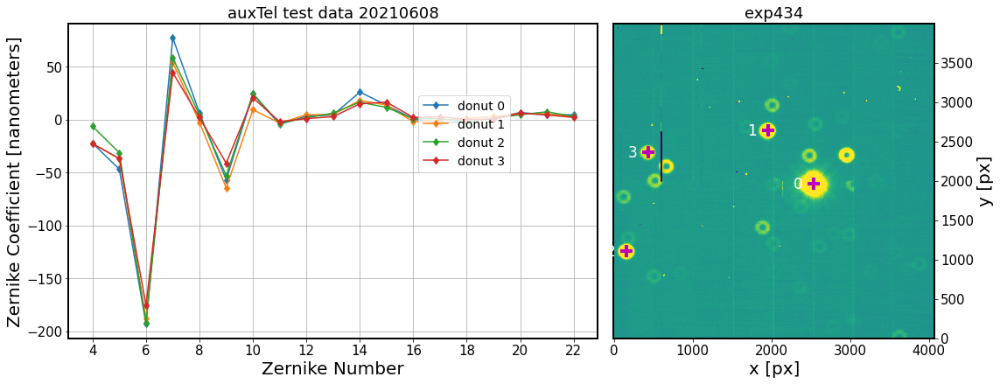

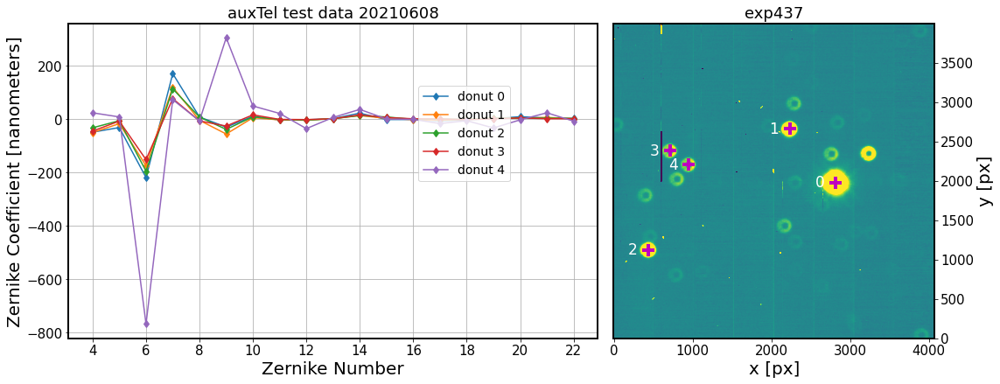

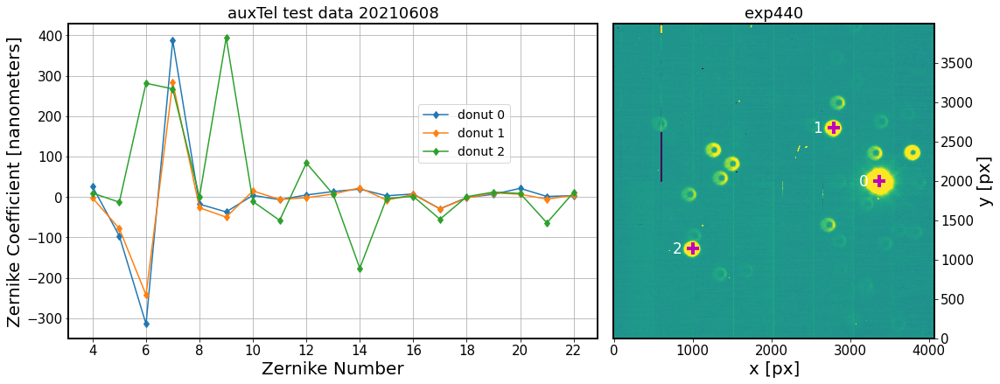

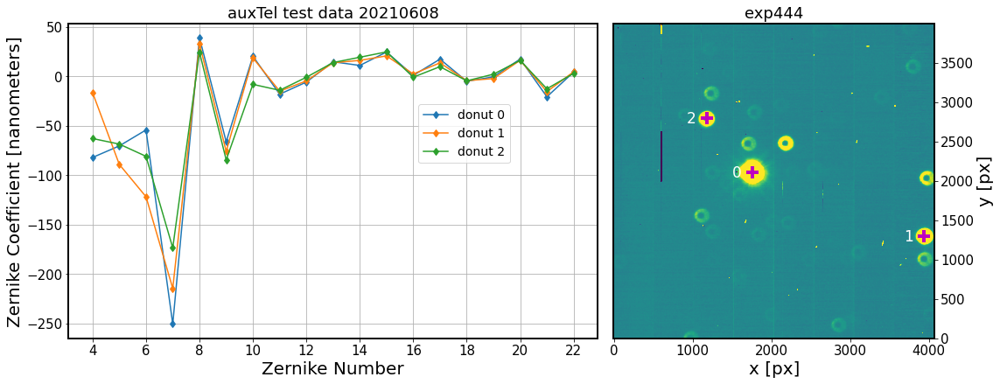

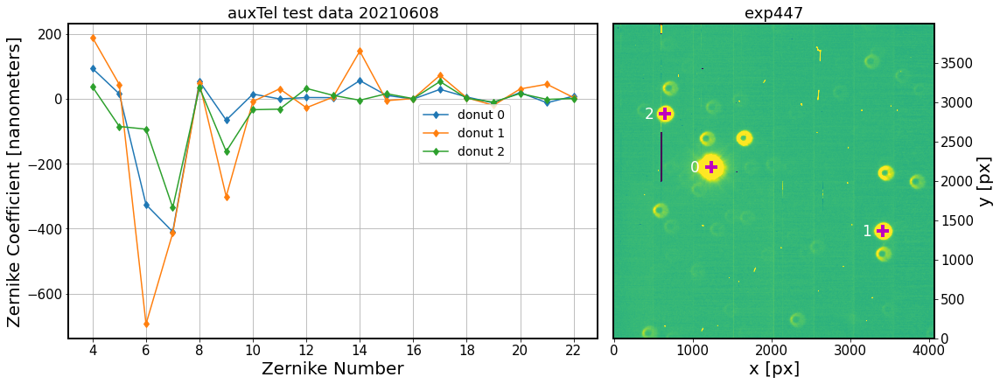

...

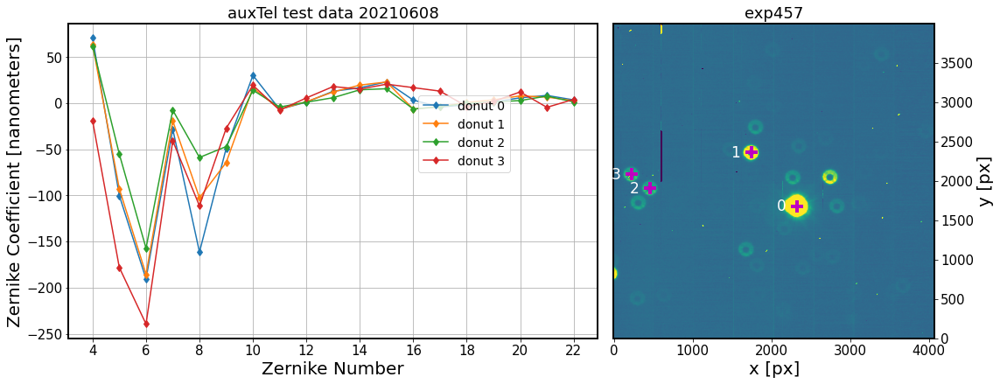

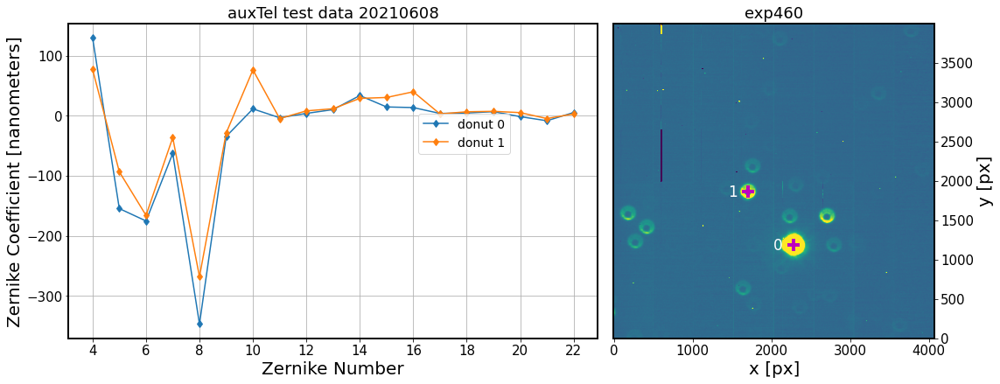

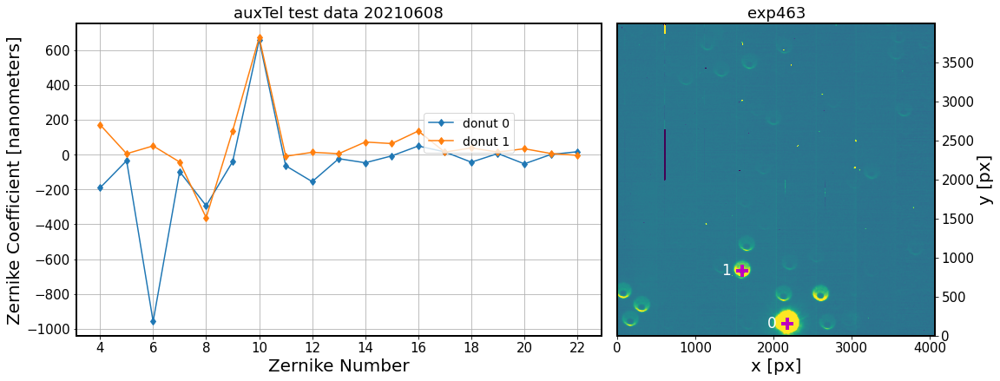

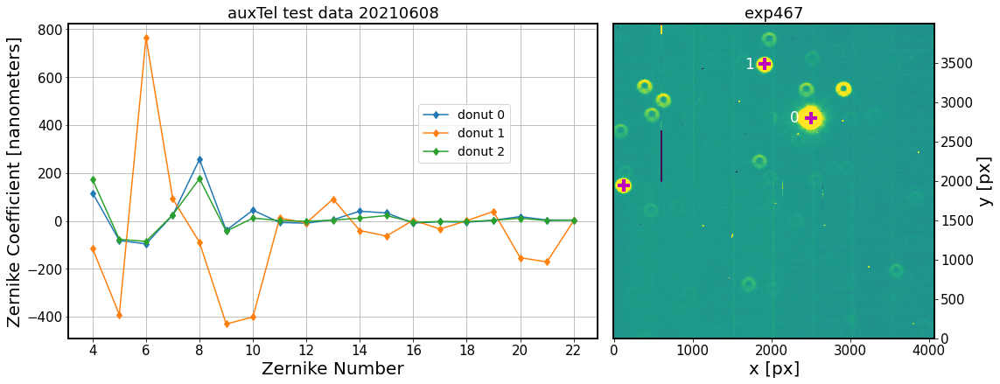

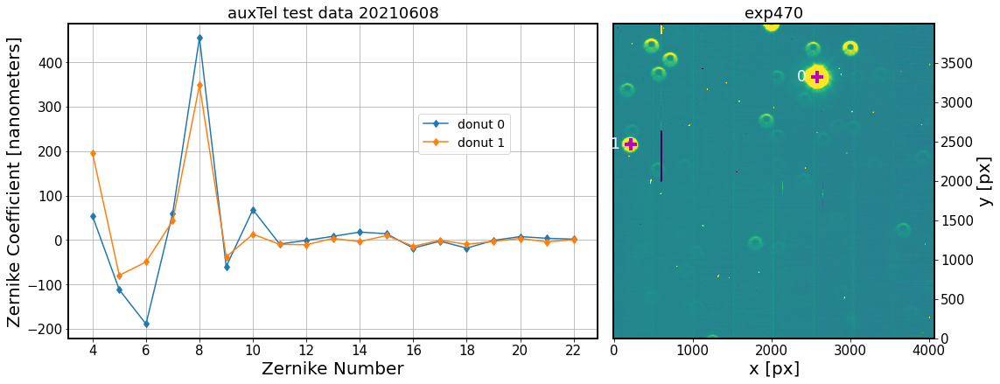

In [11]:
expIntra = [434, 437, 440, 444, 447, 450, 454, 457, 
           460, 463, 467, 470]

year = '2021'
monthDay = '0608'

for exp in expIntra:
    plot_zernike_image(exp=exp, year=year,monthDay=monthDay)

Plot only the best donuts as specified in the dictionary 

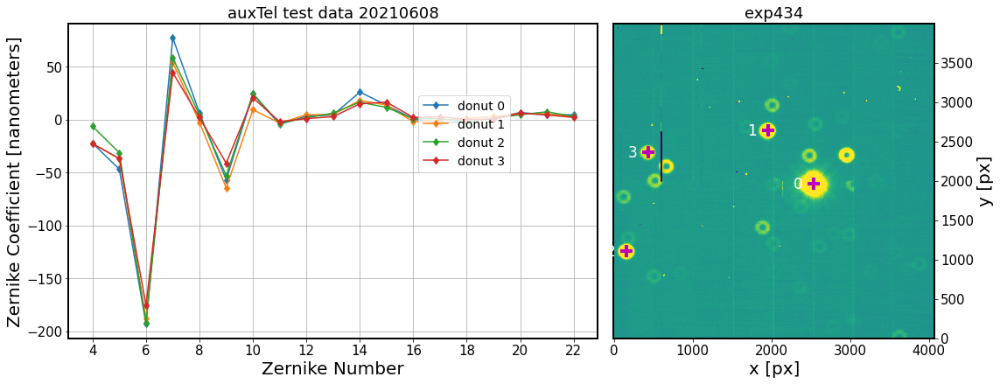

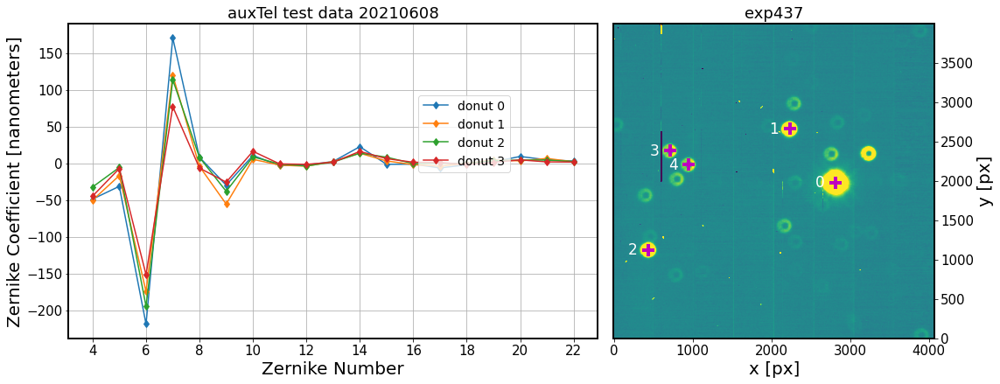

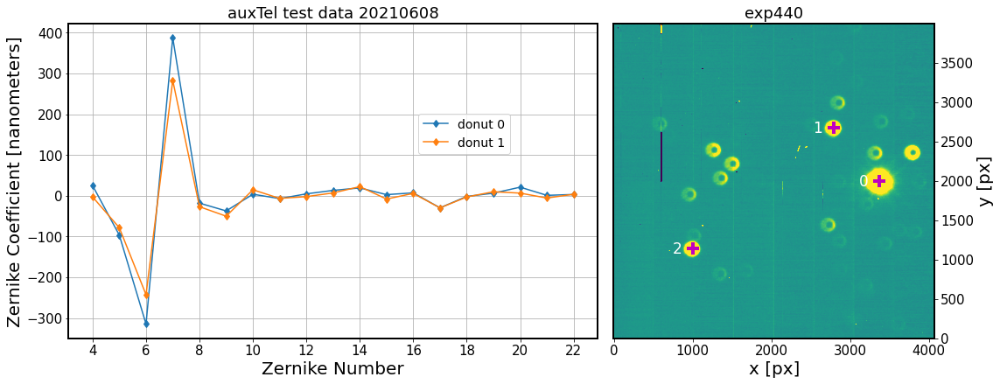

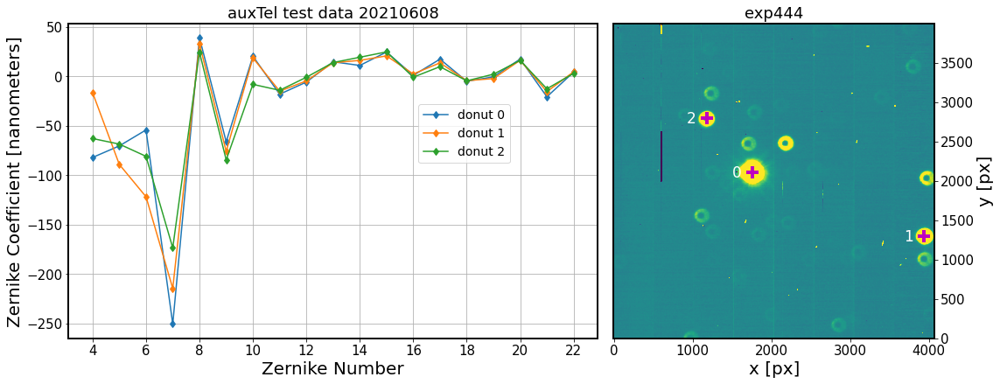

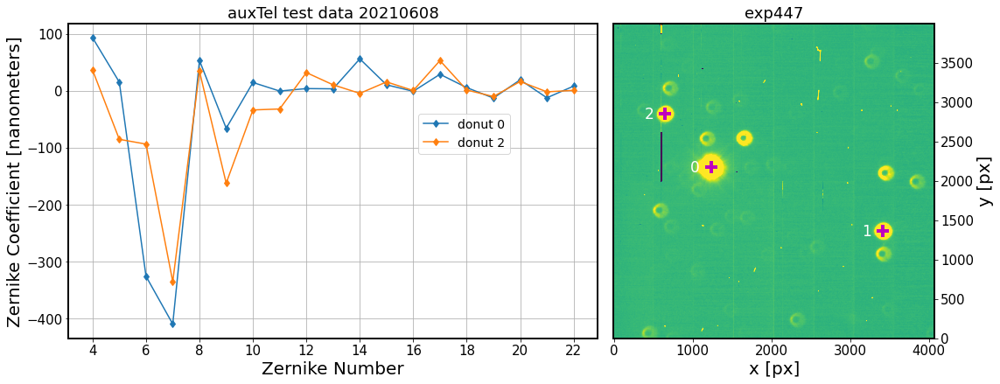

...

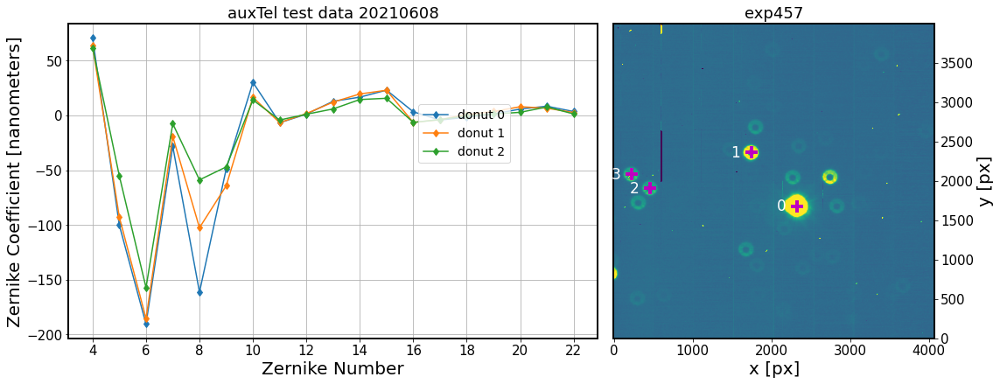

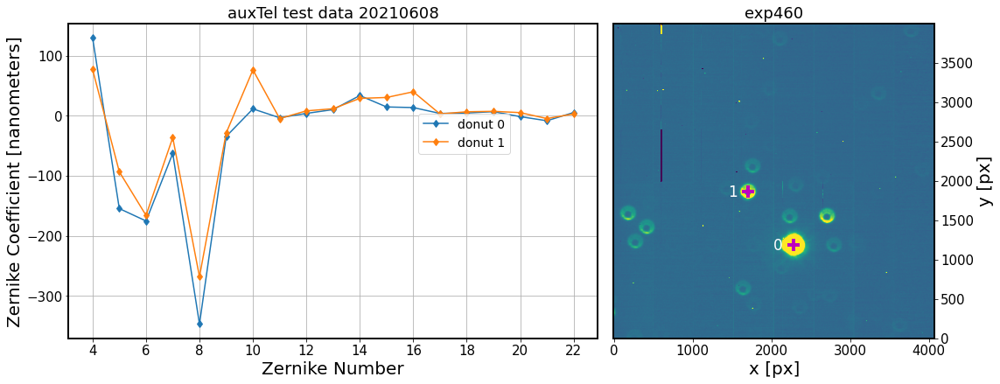

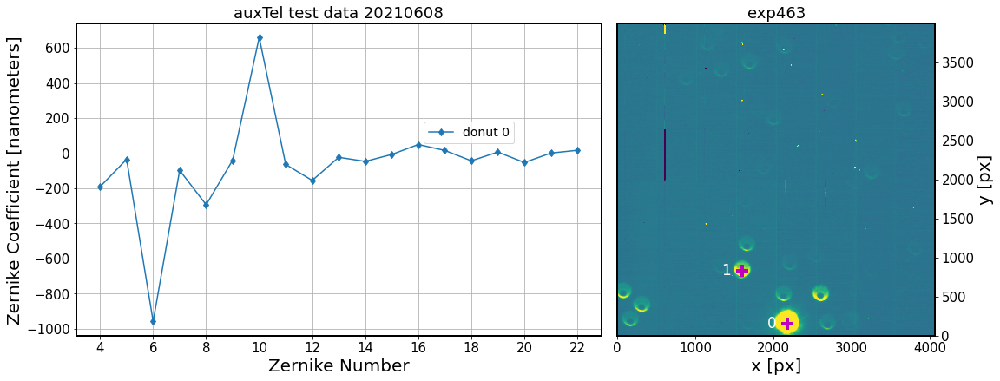

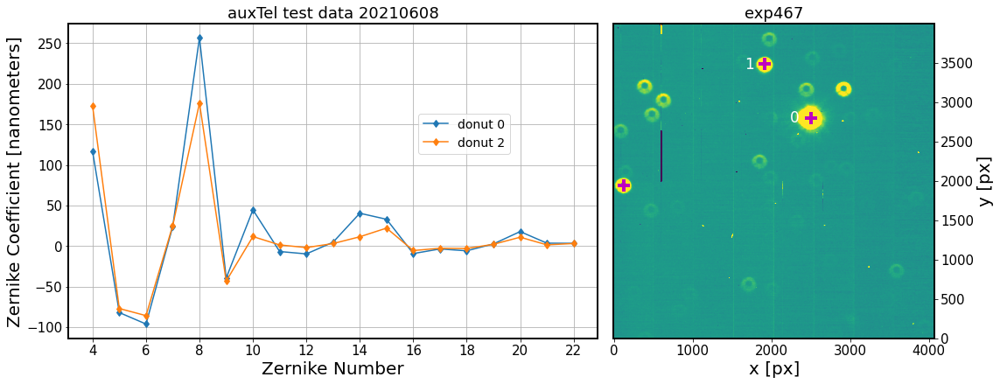

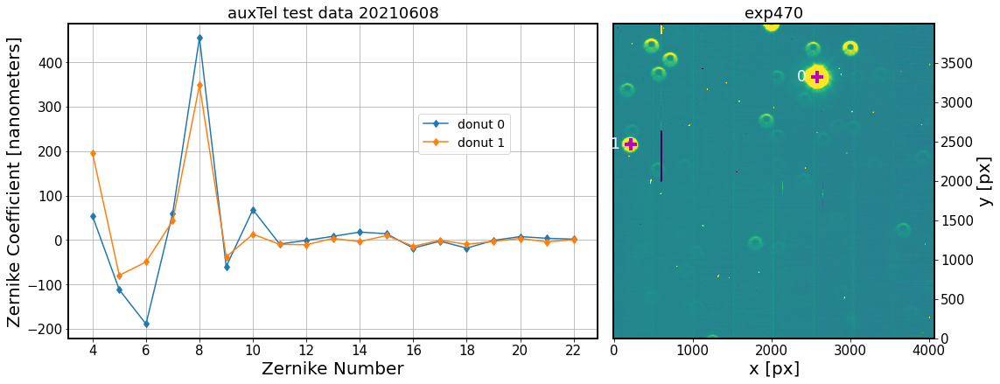

In [13]:
plot_dic ={437:[0,1,2,3],
           440:[0,1],
           447:[0,2],
           450:[0,1], 
           454:[0,1,2],
           457 :[0,1,2],
           463:[0],
           467:[0,2],
          }
dxs = {434: 0.5, 437: 1.0, 440: 2.0, 444: -1, 447: -2, 450: -3}
dyx = 
for exp in expIntra:
    plot_zernike_image(exp=exp, year=year,monthDay=monthDay, plot_dic=plot_dic)   

How would a hexapod offset in x,y translate to known Zk values?   Use Josh's notebook https://colab.research.google.com/drive/1jEYaSg9nER2VfLP3iujCEobroZgB_Frv?usp=sharing 

In [ ]:
434-435: +0.5mm in x
437-438: +1.0mm in x
440-441: +2.0mm in x
444-445: -1.0mm in x
447-448: -2.0mm in x
450-451: -3.0mm in x
454-455: +0.5mm in y
457-458: +1.0mm in y
460-461: +2.0mm in y
463-464: +4.0mm in y
467-468: -1.0mm in y
470-471: -2.0mm in y

In [15]:
zks = {434: np.array([ 0.00000000e+00,  4.60785825e+00, -2.47626943e+02,  2.15861414e+00,
         2.50802902e+00,  6.84232589e-01,  1.65901992e+01,  8.38366514e+00,
        -8.72196462e+01, -1.74177286e-04, -1.19935569e-02, -1.19788760e-01,
         4.97960929e-02, -9.74998860e-03, -9.11790597e-06,  2.60063652e-06,
         1.78812295e-01,  9.95120415e-04,  3.79513461e-05, -1.72119928e-06,
        -6.15169303e-08, -1.84353189e-07, -1.52027467e-03,  3.33275763e-05,
        -3.42692086e-04]),
 437: np.array([ 0.00000000e+00,  1.11961872e+01, -4.95274858e+02,  2.15666285e+00,
         6.53246178e+00,  1.36850228e+00,  1.77476816e+01,  8.38278628e+00,
        -1.74446519e+02, -1.81017623e-03, -2.46960380e-02,  4.96487415e-02,
         1.94198216e-01, -1.95016636e-02, -3.70607204e-05,  3.68377721e-06,
         3.57724802e-01,  9.93388285e-04,  1.07584379e-04, -6.47552535e-06,
        -6.46067252e-07, -1.45865539e-09, -2.76746529e-03,  6.65629992e-05,
        -1.37038236e-03]),
 440: np.array([ 0.00000000e+00,  3.75509661e+01, -9.90717480e+02,  2.14885652e+00,
         2.26309993e+01,  2.73729985e+00,  2.23778530e+01,  8.37927334e+00,
        -3.48950856e+02, -8.35179379e-03, -5.50682103e-02,  7.27378075e-01,
         7.71784881e-01, -3.90103864e-02, -1.50160949e-04, -2.85772024e-06,
         7.16253871e-01,  9.87984709e-04,  4.69510279e-04, -2.68323261e-05,
         8.92143203e-08,  1.28092665e-07, -7.75211955e-03,  1.32840292e-04,
        -5.47954459e-03]),
 444: np.array([ 0.00000000e+00,  1.11961870e+01,  4.95274858e+02,  2.15666217e+00,
         6.53246203e+00, -1.36850191e+00,  1.77476823e+01,  8.38278668e+00,
         1.74446520e+02, -1.81007564e-03,  2.46958035e-02,  4.96483111e-02,
         1.94197323e-01,  1.95014139e-02, -3.65045483e-05, -4.53297101e-06,
        -3.57725032e-01,  9.93526056e-04, -1.07691192e-04, -6.19780143e-06,
         7.53975806e-07, -9.05462504e-08, -2.76741826e-03, -6.65719483e-05,
        -1.37055586e-03]),
 447: np.array([ 0.00000000e+00,  3.75509667e+01,  9.90717480e+02,  2.14885648e+00,
         2.26309990e+01, -2.73729959e+00,  2.23778529e+01,  8.37927319e+00,
         3.48950856e+02, -8.35203190e-03,  5.50682689e-02,  7.27378399e-01,
         7.71784959e-01,  3.90108900e-02, -1.50564811e-04,  2.52088367e-06,
        -7.16253309e-01,  9.88048356e-04, -4.70067558e-04, -2.66697993e-05,
        -2.92555371e-08, -7.48817205e-08, -7.75243060e-03, -1.33452175e-04,
        -5.47977979e-03]),
 450: np.array([ 0.00000000e+00,  8.14807492e+01,  1.48649563e+03,  2.13585048e+00,
         4.94647633e+01, -4.10668882e+00,  3.00956559e+01,  8.37342003e+00,
         5.23570828e+02, -1.92519741e-02,  9.67911160e-02,  1.85684353e+00,
         1.73435993e+00,  5.85355007e-02, -3.49080802e-04,  3.08797831e-05,
        -1.07639041e+00,  9.78793007e-04, -1.34192382e-03, -6.10926010e-05,
        -1.04403854e-07, -2.96752272e-07, -1.60594512e-02, -1.99951811e-04,
        -1.23270989e-02]),
 454: np.array([ 0.00000000e+00,  2.98999704e+00,  3.36365093e-07, -2.45413898e+02,
         1.55861653e+00, -2.49412886e-07,  1.51336384e+01, -7.88162025e+01,
        -1.08238401e-07, -1.08400025e-02,  1.60548472e-07, -1.31623914e-01,
        -3.67349368e-02,  2.64640701e-07,  6.43471362e-06, -2.37810973e-07,
        -2.17253798e-07,  1.79747169e-01,  1.68665280e-07,  2.93674730e-05,
         2.04853633e-07, -5.49435570e-08, -1.48061249e-03, -1.22582754e-07,
         3.09092193e-04]),
 457: np.array([ 0.00000000e+00,  7.96123420e+00, -6.81816859e-07, -4.93003833e+02,
         4.63410728e+00, -4.10027899e-07,  1.32913769e+01, -1.66022303e+02,
         2.94071664e-07, -2.02477697e-02, -4.18864814e-07,  2.60017592e-02,
        -1.71426775e-01,  6.53559327e-08,  2.89820768e-05,  1.15696016e-07,
        -4.49974261e-07,  3.58578344e-01,  4.38456980e-07,  2.97212012e-05,
        -9.77406916e-08, -5.22544901e-07, -2.68657276e-03,  7.58062779e-08,
         1.30360416e-03]),
 460: np.array([ 0.00000000e+00,  3.10837290e+01, -1.26926462e-08, -9.88317937e+02,
         1.88359352e+01, -3.73342156e-07,  7.29199567e+00, -3.40481243e+02,
        -9.14625484e-08, -3.08026708e-02,  1.09559472e-07,  6.80161366e-01,
        -7.29668143e-01, -3.28170354e-07,  1.16937520e-04,  2.79621228e-07,
        -5.40370376e-08,  7.16879008e-01,  7.64196785e-08, -1.82419717e-04,
        -7.90408523e-08,  9.61534557e-08, -7.59126280e-03,  3.43002447e-09,
         5.34696103e-03]),
 463: np.array([ 0.00000000e+00,  1.30066418e+02,  5.48073951e-07, -1.98007041e+03,
         7.94526012e+01,  1.45663057e-07, -1.39700444e+01, -6.89788502e+02,
        -1.01398376e-07,  1.04961817e-03, -3.04572868e-07,  3.34370175e+00,
        -3.00122306e+00,  4.08807812e-07,  3.88250598e-04,  4.60417135e-07,
        -1.73287764e-07,  1.43884894e+00, -1.24732318e-07, -2.35080940e-03,
        -1.39044044e-08,  3.38790074e-07, -2.73658443e-02, -1.43169571e-07,
         2.16477611e-02]),
 467: np.array([ 0.00000000e+00,  1.44346054e+01,  3.21855698e-07,  4.97339198e+02,
         8.43294125e+00,  2.28277043e-07,  1.60313866e+01,  1.82795383e+02,
         4.03666409e-07,  2.53534370e-02, -3.01623361e-07,  7.33950152e-02,
        -2.10444760e-01, -4.11822511e-08,  4.42481791e-05,  1.87673516e-07,
        -4.29897909e-07, -3.56674126e-01,  4.41769355e-07, -1.54385999e-05,
         4.37130068e-08, -8.79470415e-09, -2.84790380e-03, -7.22409991e-08,
         1.43608709e-03]),
 470: np.array([ 0.00000000e+00,  4.40320280e+01,  4.16154840e-08,  9.92703821e+02,
         2.64345622e+01,  5.39101414e-07,  1.27722884e+01,  3.57269820e+02,
        -4.11601214e-07,  4.90001440e-02,  7.54415097e-08,  7.74992517e-01,
        -8.07752908e-01, -3.82010095e-08,  1.69450315e-04, -1.66860513e-08,
         2.92996600e-07, -7.15235009e-01, -1.75023435e-07,  2.38045411e-04,
         2.13346546e-07,  3.98565333e-07, -7.91565577e-03, -2.47732492e-07,
         5.61332165e-03])}

In [17]:
len(zks[470])

25

In [26]:
year = '2021'
monthDay = '0608'
exp=470
zkResultsFile = f'zerDic_{year}{monthDay}00{exp}.npy'
zkFit = np.load(zkResultsFile, allow_pickle=True).item()



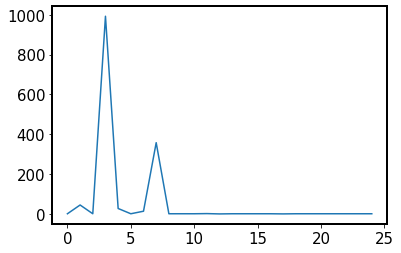

In [25]:
plt.plot(zks[470], 
           )

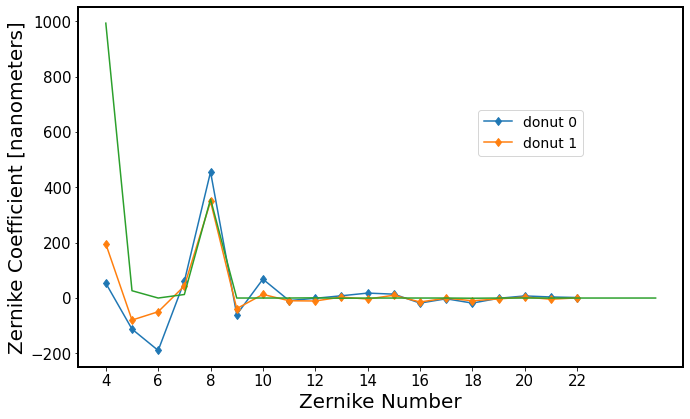

In [31]:
fig = plt.figure(figsize=(14, 5))

ax1 = fig.add_axes([0,0,0.6,1])  


# only plot those donuts constrained by the dict
plot_donuts = range(len(zkFit['outputZernikesRaw']))

# plot Zk results for all donuts 
for i in plot_donuts:
    ax1.plot(np.arange(4, 23),1000*zkFit['outputZernikesRaw'][i], 
             '-d', label=f'donut {i}')
ax1.set_xlabel('Zernike Number',)
ax1.set_ylabel('Zernike Coefficient [nanometers]', )
ax1.legend(fontsize=14, loc='center left', bbox_to_anchor=[.65, 0.65])
ax1.set_xticks(np.arange(4,23)[::2])
ax1.plot(np.arange(4, 26), zks[470][3:], 
           )

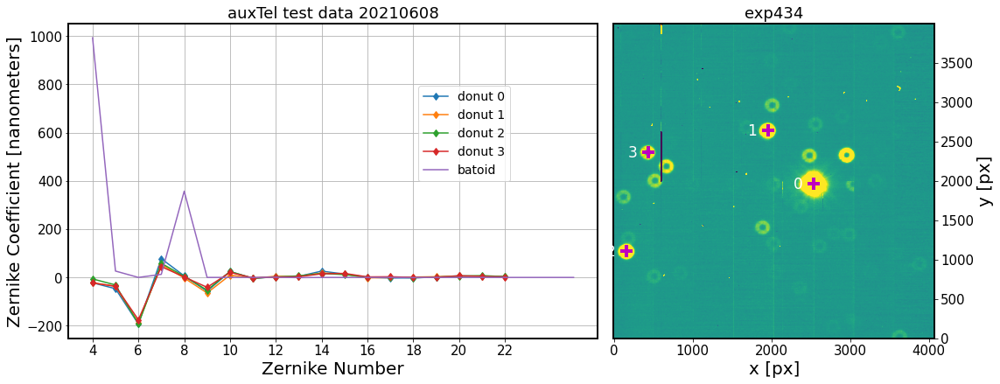

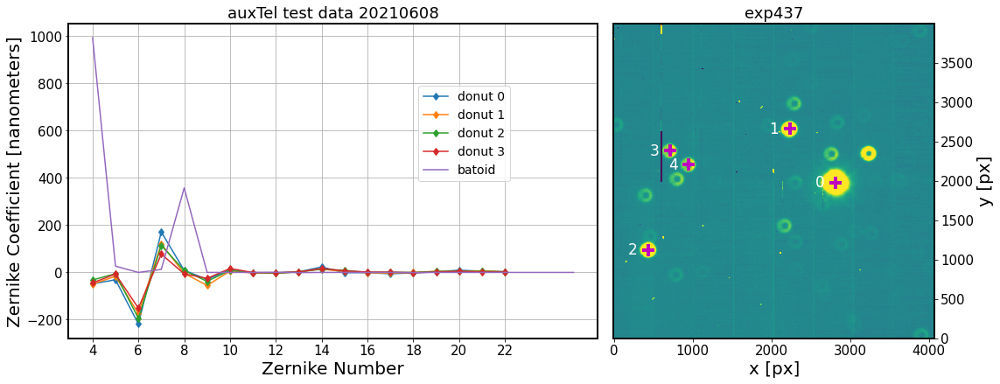

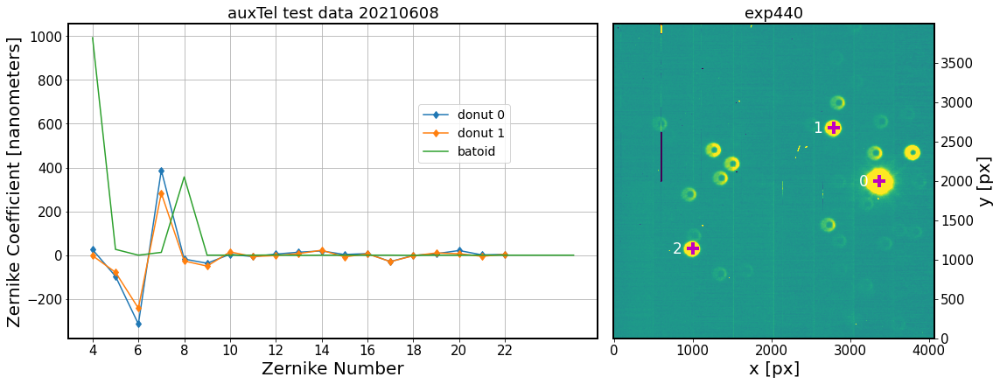

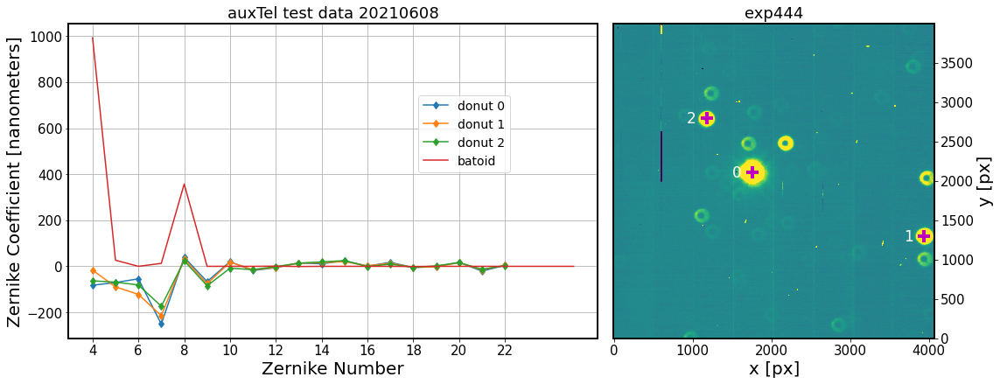

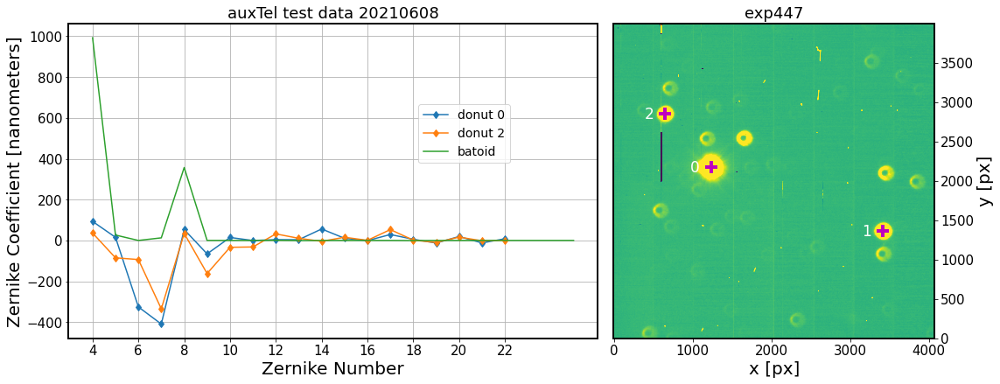

...

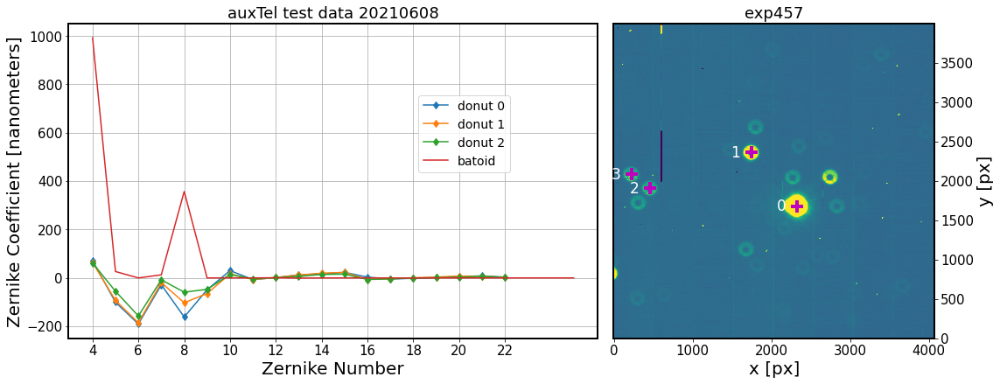

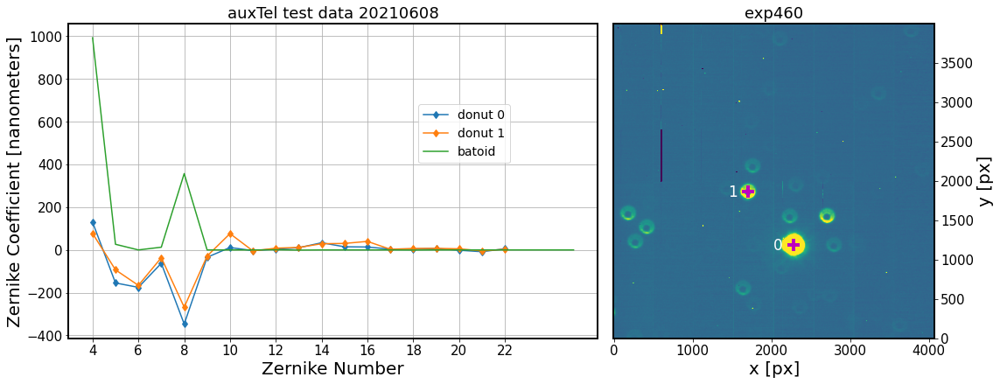

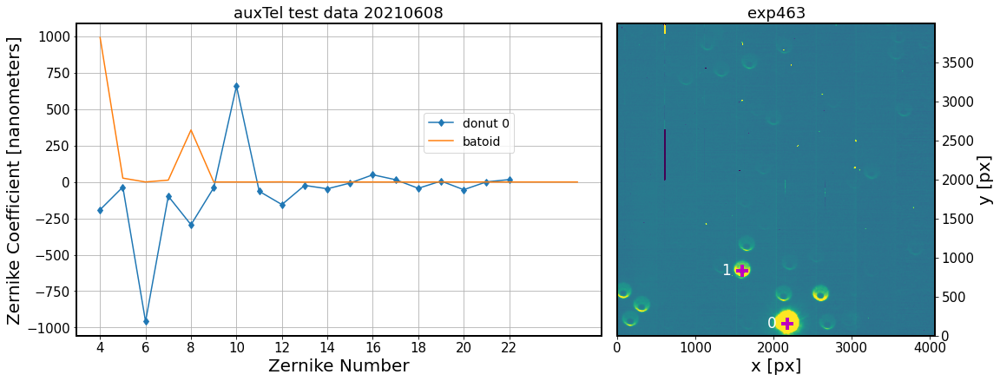

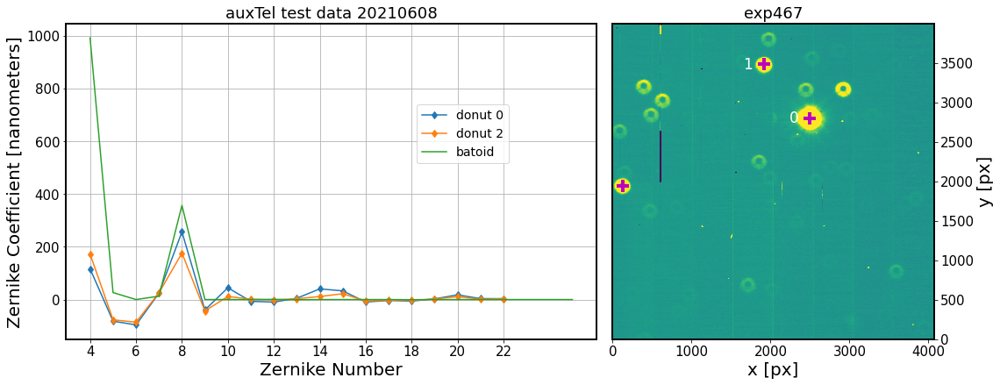

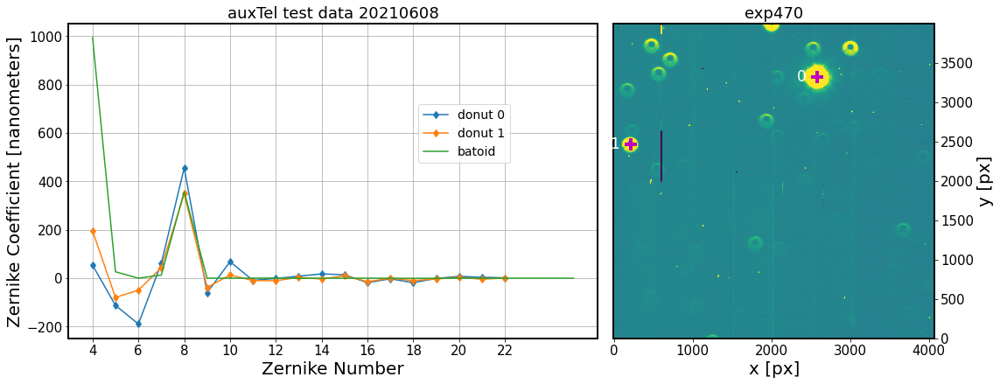

In [34]:
for exp in expIntra:
    plot_zernike_image(exp=exp, year=year,monthDay=monthDay, plot_dic=plot_dic, zk_dic = zks,
                      )   

Plot the residuals: the difference between median fit Zk value and the batoid values

In [99]:
def plot_zernike_residuals(exp=464, year='2021',monthDay='0608', plot_dic = {},
                   zk_dic={}):
    #zk_dic = zks
    # plot the figure ...   
    fig = plt.figure(figsize=(8, 5))

    ####################################
    ### left - plot the fit results  ###
    #################################### 

    #add_axes([xmin,ymin,dx,dy]) 
    ax1 = fig.add_axes([0,0.4,1,0.6])  

    #for exp in expIntra:
    zkResultsFile = f'zerDic_{year}{monthDay}00{exp}.npy'
    zkFit = np.load(zkResultsFile, allow_pickle=True).item()

    # choose which donuts to plot 

    zkFitInclude = []
    # only plot those donuts constrained by the dict
    if exp in plot_dic.keys(): 
        plot_donuts = plot_dic[exp]

    else: # or otherwise, plot all
        plot_donuts = range(len(zkFit['outputZernikesRaw']))

    # calculate median Zk results for selected donuts
    for i in plot_donuts:
        zkFitInclude.append(zkFit['outputZernikesRaw'][i])

    # plot the median 
    zkFitMedian = np.median(zkFitInclude, axis=0)
    zkFitMedianNm = 1000 * zkFitMedian
    ax1.plot(np.arange(4, 23),zkFitMedianNm, 
                 '-d', label=f'median fit')

    # plot the batoid result 
    if exp in zk_dic.keys():

        zkBat = zk_dic[exp][3:-3]
        ax1.plot(np.arange(4, 23), zkBat, '-o',
                 label='batoid',

           )

    # add labels and legend 
    #ax1.set_xlabel('Zernike Number',)
    ax1.set_ylabel('Zk Coeff [nm]', )
    ax1.legend(fontsize=14, loc='center left', bbox_to_anchor=[.65, 0.65])
    #ax1.xaxis('off')
    ax1.grid()
    ax1.set_title(f'auxTel test data {year}{monthDay}, exp {exp}', fontsize=18)
    #ax1.set_xticks([])

    # plot residuals
    #add_axes([xmin,ymin,dx,dy]) 
    ax2 = fig.add_axes([0,0,1,0.4])  
    residuals = zkFitMedianNm - zkBat
    ax2.plot(np.arange(4, 23), residuals, '-D',c='green', label='fit-simulated')
    ax2.legend()
    ax2.set_xlabel('Zernike Number',)
    ax2.set_ylabel('Zk Coeff [nm]', )
    ax2.grid()
    ax2.sharex(ax1)
    ax2.set_xticks(np.arange(4,23)[::2])
    #ax2.text(0.7,0.5, 'residuals', transform=ax2.transAxes)
    # add numerical values to the plot 
#     for i,j in zip(np.arange(4, 23),residuals):
#             ax2.annotate(str(np.round(j,2)), xy=(i,j), 
#                          xytext=(10,10), textcoords='offset points')
    
    
    #ax2.set_ylim([-100,200])
    fig.subplots_adjust(hspace=0,wspace=0)

In [96]:
expIntra

[434, 437, 440, 444, 447, 450, 454, 457, 460, 463, 467, 470]

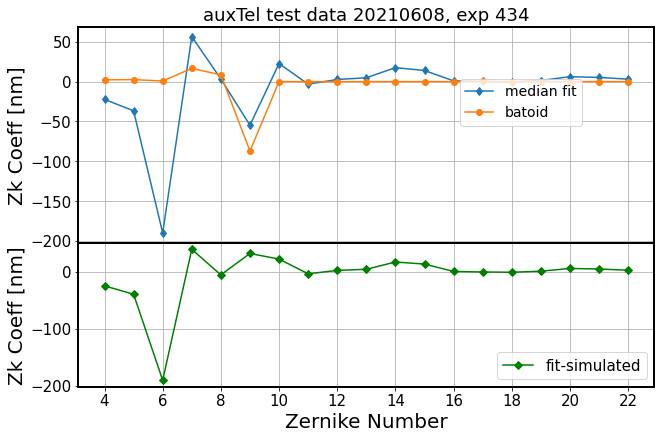

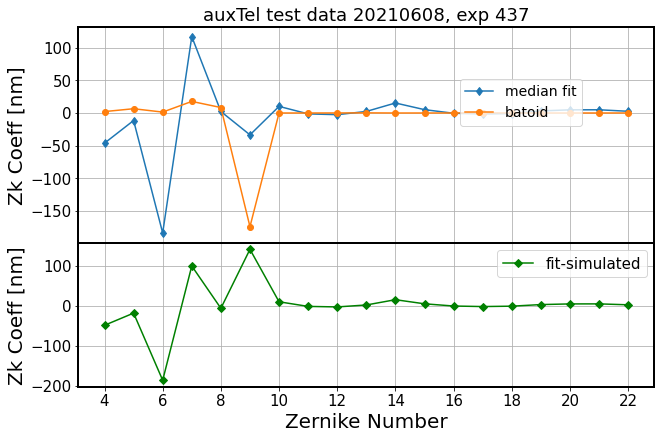

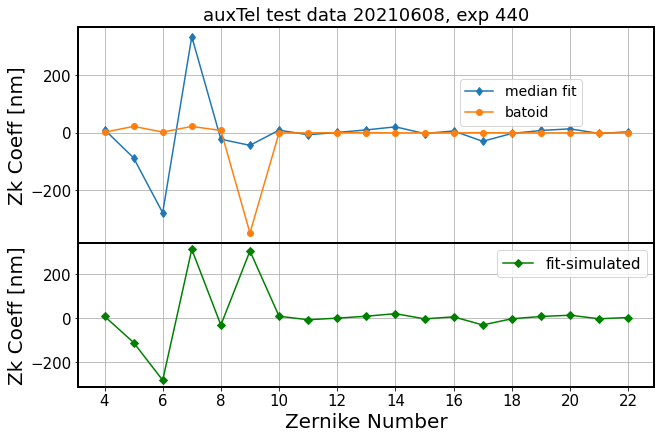

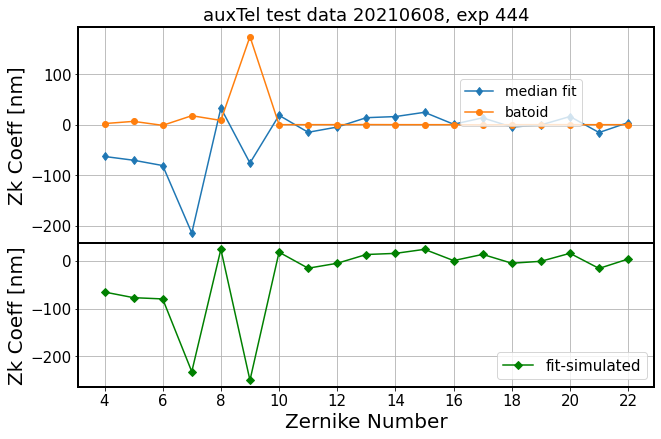

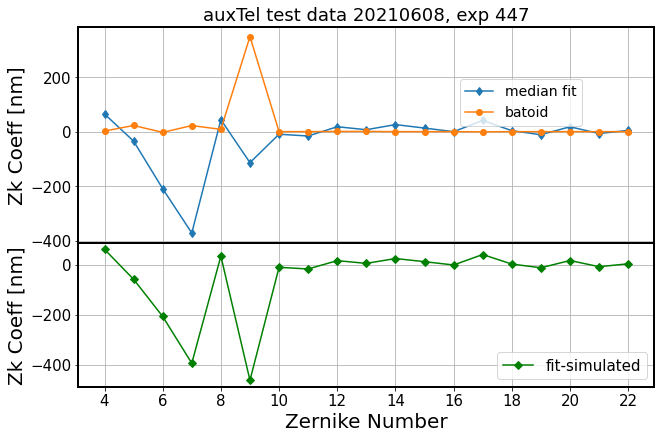

...

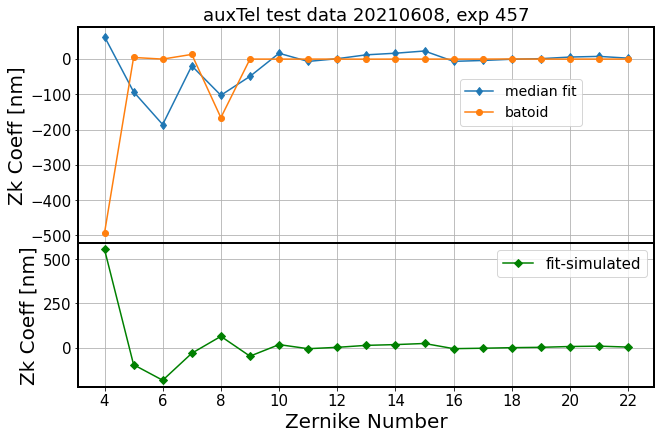

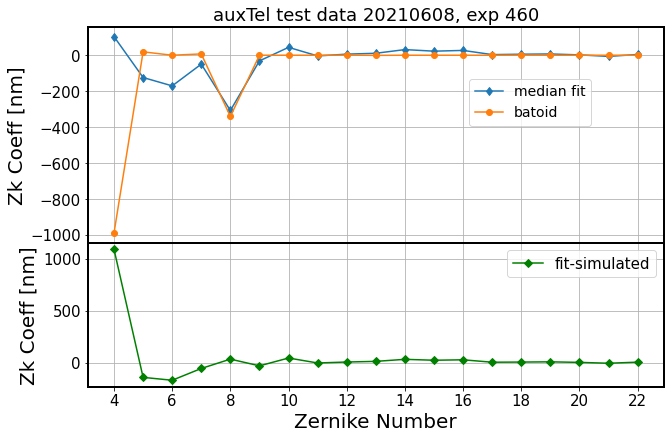

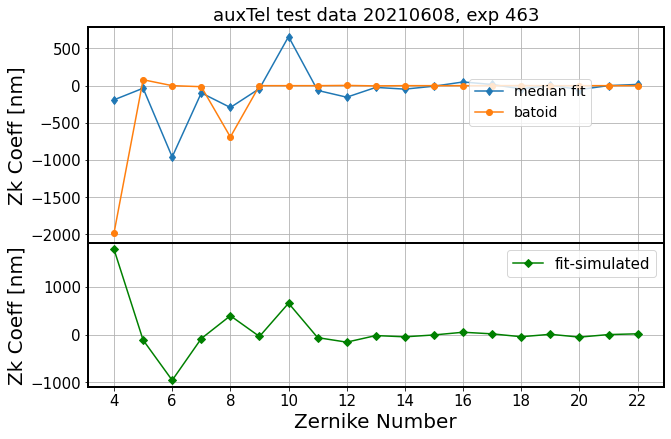

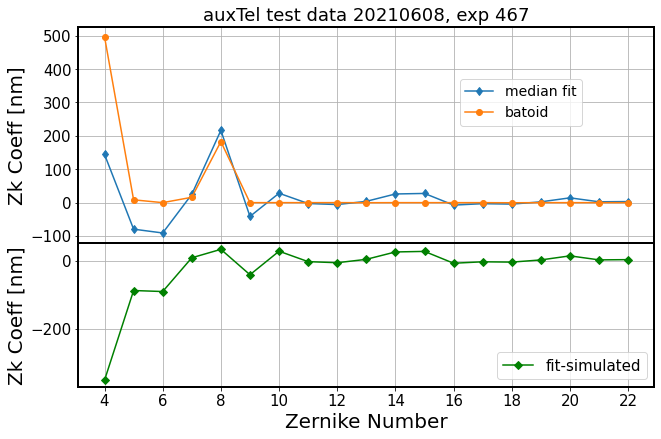

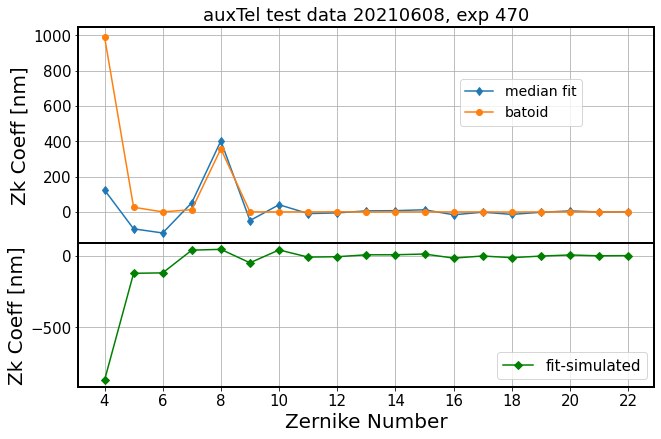

In [100]:
for exp in expIntra:
    plot_zernike_residuals(exp=exp, year='2021',monthDay='0608', plot_dic = plot_dic,
                   zk_dic=zks)

plot the residuals for different dx, dy displacement... 

In [101]:
# Calculate the difference between median for each exposure and batoid 

zkExpSummary = {}
for exp in expIntra:
    zkResultsFile = f'zerDic_{year}{monthDay}00{exp}.npy'
    zkFit = np.load(zkResultsFile, allow_pickle=True).item()

    # choose which donuts to plot 

    zkFitInclude = []
    # only use those donuts constrained by the dict
    if exp in plot_dic.keys(): 
        plot_donuts = plot_dic[exp]

    else: # or otherwise, use all
        plot_donuts = range(len(zkFit['outputZernikesRaw']))

    # calculate median Zk results for selected donuts
    for i in plot_donuts:
        zkFitInclude.append(zkFit['outputZernikesRaw'][i])

    zkFitMedian = np.median(zkFitInclude, axis=0)
    zkFitMedianNm = 1000 * zkFitMedian # these are Zk4:22 
   

    # plot the batoid result 
    if exp in zk_dic.keys():
        zkBat = zk_dic[exp][3:-3] # selecting from Zk1:25  only  Zk4:22
        
    zkExpSummary[exp] = {'medianFit':zkFitMedianNm,
                         'batoidSim':zkBat,
                         'residuals':zkFitMedianNm-zkBat
                        }

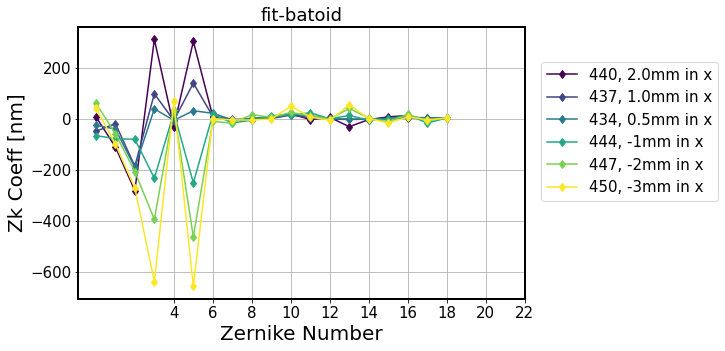

In [119]:


# label with displacement
disp_dic  = {434: "+0.5mm in x",
             437: "+1.0mm in x",
             440: "+2.0mm in x",
             444: "-1.0mm in x",
             447: "-2.0mm in x",
             450: "-3.0mm in x",
             454: "+0.5mm in y",
             457: "+1.0mm in y",
             460: "+2.0mm in y",
             463: "+4.0mm in y",
             467: "-1.0mm in y",
             470: "-2.0mm in y"}

dxs = {440:2.0, 437:1.0, 434:0.5, 444:-1, 
       447:-2, 450:-3, }

dyx = {463:4,460:2, 457:1, 454:0.5,
       467:-1, 470:-2}

# Plot these results
fig = plt.figure(figsize=(8, 5))
ax = fig.add_subplot()
ax.set_title('fit-batoid')

# x-displacement
n_lines = len(dxs.keys())
color_idx = np.linspace(0, 1, n_lines)

i  =0 
for exp in dxs.keys():
    color = plt.cm.viridis(color_idx[i])
    ax.plot(zkExpSummary[exp]['residuals'], '-d', label=f'{exp}, {dxs[exp]}mm in x',c=color)   
    i += 1 
ax.legend( bbox_to_anchor=[1.02, 0.9],ncol=1)
ax.set_xlabel('Zernike Number',)
ax.set_ylabel('Zk Coeff [nm]', )
ax.grid()
ax.set_xticks(np.arange(4,23)[::2])

In [121]:
np.sgn(+1)

AttributeError: module 'numpy' has no attribute 'sgn'

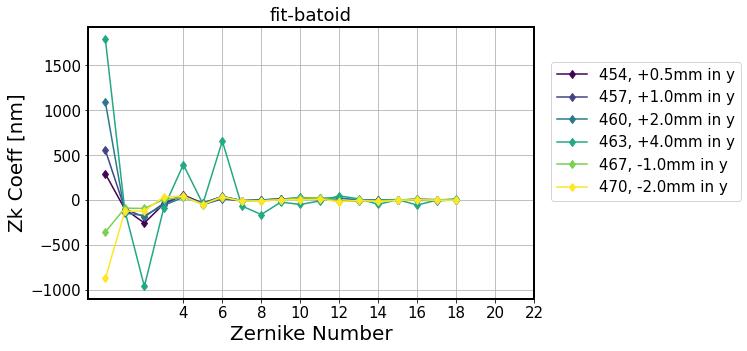

In [117]:
fig = plt.figure(figsize=(8, 5))
ax = fig.add_subplot()
ax.set_title('fit-batoid')

# y-displacement
exps = [454,457,460,463,467,470]
n_lines = len(exps)
color_idx = np.linspace(0, 1, n_lines)

i  =0 
for exp in exps:
    color = plt.cm.viridis(color_idx[i])
    ax.plot(zkExpSummary[exp]['residuals'], '-d', label=f'{exp}, {disp_dic[exp]}',c=color)   
    i += 1 
ax.legend( bbox_to_anchor=[1.02, 0.9],ncol=1)
ax.set_xlabel('Zernike Number',)
ax.set_ylabel('Zk Coeff [nm]', )
ax.grid()
ax.set_xticks(np.arange(4,23)[::2])